In [1]:
import pandas as pd
import ast
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go
import json


Bad key savefig.frameon in file C:\Users\15714\anaconda3\envs\cds490\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file C:\Users\15714\anaconda3\envs\cds490\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.1/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file C:\Users\15714\anaconda3\envs\cds490\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout  # a log filename, sys.stdout or sys.stderr')
You probably nee

In [2]:
# convert string to dictionary with literal_eval

df_replies = pd.read_csv('./data/false_tweets.csv')
df_replies['emu'] = df_replies['entities.user_mentions']
df_replies = df_replies[~df_replies['emu'].isin(['[]'])]
df_replies['emu'] = [ast.literal_eval(i) for i in df_replies['emu']]
df_replies = df_replies.reset_index()
df_replies.drop(df_replies.columns[[0,1]],axis=1,inplace=True)
df_replies

C:\Users\15714\anaconda3\envs\cds490\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (240,275,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,328,329) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,geo.type,geo.coordinates,coordinates.type,coordinates.coordinates,scopes.followers,retweeted_status.quoted_status.quoted_status_id,retweeted_status.quoted_status.quoted_status_id_str,withheld_in_countries,user.withheld_in_countries,emu
0,Sun Apr 26 18:22:40 +0000 2020,1254476000425017344,1254476000425017344,@TeachOnTheRight @JPL_Reader @tedcruz Please s...,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.254473e+18,1.254473e+18,1.488505e+09,1.488505e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'TeachOnTheRight', 'name': 'T..."
1,Fri Apr 24 10:28:28 +0000 2020,1253631890281476096,1253631890281476096,@Twitch_Grip @brianstelter We have had more de...,True,"<a href=""http://twitter.com/download/android"" ...",1.253628e+18,1.253628e+18,1.323341e+09,1.323341e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Twitch_Grip', 'name': 'TG', ..."
2,Tue Apr 28 17:05:10 +0000 2020,1255181275977015296,1255181275977015296,@evolnemesis @BabeTruth2 No. Faith based learn...,True,"<a href=""http://twitter.com/download/android"" ...",1.255180e+18,1.255180e+18,7.333878e+17,7.333878e+17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'evolnemesis', 'name': 'Jesse..."
3,Fri May 01 00:12:09 +0000 2020,1256013502298370048,1256013502298370048,@HughJassman6 @cutzie80 @jim_walkup @SenPoleha...,True,"<a href=""http://twitter.com/download/android"" ...",1.256000e+18,1.256000e+18,1.192958e+18,1.192958e+18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'HughJassman6', 'name': 'Hugh..."
4,Sat Apr 25 21:45:11 +0000 2020,1254164579459854336,1254164579459854336,@5151mpk1 @grumpyMichael @ScottMorrisonMP have...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",1.253975e+18,1.253975e+18,9.951980e+17,9.951980e+17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': '5151mpk1', 'name': '💧5151mpk..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,Sun May 03 14:02:51 +0000 2020,1256947333180334080,1256947333180334080,RT @vmoning: oh my god Namjoon... please no......,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'vmoning', 'name': 'Jungkook ..."
1347,Sat Jun 27 23:49:25 +0000 2020,1277026280484098048,1277026280484098048,@joywood49789830 @KaytuhlynPeters @ch1efke1th ...,True,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.277023e+18,1.277023e+18,1.274049e+18,1.274049e+18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'joywood49789830', 'name': 'j..."
1348,Sun Jun 07 17:05:50 +0000 2020,1269676954590089216,1269676954590089216,@Fred45017943 @CellierGomez @JRossotti @Yokori...,True,"<a href=""http://twitter.com/download/iphone"" r...",1.269675e+18,1.269675e+18,1.142645e+18,1.142645e+18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'CellierGomez', 'name': 'Shar..."
1349,Sat May 02 21:04:17 +0000 2020,1256690999549669376,1256690999549669376,@realDonaldTrump\n“We’ve tested more than ever...,True,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,2.507388e+07,2.507388e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'realDonaldTrump', 'name': 'D..."


In [3]:
# create columns for each individual edge

final_replies = (df_replies.explode('emu')
              .assign(mention=lambda x: x['emu'].str['screen_name'])
              .drop('emu',1))
final_replies

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,geo.type,geo.coordinates,coordinates.type,coordinates.coordinates,scopes.followers,retweeted_status.quoted_status.quoted_status_id,retweeted_status.quoted_status.quoted_status_id_str,withheld_in_countries,user.withheld_in_countries,mention
0,Sun Apr 26 18:22:40 +0000 2020,1254476000425017344,1254476000425017344,@TeachOnTheRight @JPL_Reader @tedcruz Please s...,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.254473e+18,1.254473e+18,1.488505e+09,1.488505e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TeachOnTheRight
0,Sun Apr 26 18:22:40 +0000 2020,1254476000425017344,1254476000425017344,@TeachOnTheRight @JPL_Reader @tedcruz Please s...,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.254473e+18,1.254473e+18,1.488505e+09,1.488505e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,JPL_Reader
0,Sun Apr 26 18:22:40 +0000 2020,1254476000425017344,1254476000425017344,@TeachOnTheRight @JPL_Reader @tedcruz Please s...,False,"<a href=""https://mobile.twitter.com"" rel=""nofo...",1.254473e+18,1.254473e+18,1.488505e+09,1.488505e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tedcruz
1,Fri Apr 24 10:28:28 +0000 2020,1253631890281476096,1253631890281476096,@Twitch_Grip @brianstelter We have had more de...,True,"<a href=""http://twitter.com/download/android"" ...",1.253628e+18,1.253628e+18,1.323341e+09,1.323341e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Twitch_Grip
1,Fri Apr 24 10:28:28 +0000 2020,1253631890281476096,1253631890281476096,@Twitch_Grip @brianstelter We have had more de...,True,"<a href=""http://twitter.com/download/android"" ...",1.253628e+18,1.253628e+18,1.323341e+09,1.323341e+09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,brianstelter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,Wed May 06 02:05:39 +0000 2020,1257854004530462720,1257854004530462720,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...,True,"<a href=""http://twitter.com/download/iphone"" r...",1.257854e+18,1.257854e+18,4.022534e+07,4.022534e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,chillykreuz
1350,Wed May 06 02:05:39 +0000 2020,1257854004530462720,1257854004530462720,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...,True,"<a href=""http://twitter.com/download/iphone"" r...",1.257854e+18,1.257854e+18,4.022534e+07,4.022534e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Det9651
1350,Wed May 06 02:05:39 +0000 2020,1257854004530462720,1257854004530462720,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...,True,"<a href=""http://twitter.com/download/iphone"" r...",1.257854e+18,1.257854e+18,4.022534e+07,4.022534e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ogflorida9
1350,Wed May 06 02:05:39 +0000 2020,1257854004530462720,1257854004530462720,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...,True,"<a href=""http://twitter.com/download/iphone"" r...",1.257854e+18,1.257854e+18,4.022534e+07,4.022534e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TheRightMelissa


In [4]:
final_replies = final_replies[['user.screen_name', 'mention', 'text']]
final_replies = final_replies.reset_index()
final_replies = final_replies[['user.screen_name', 'mention', 'text']]
final_replies

,user.screen_name,mention,text
0,neekademus,TeachOnTheRight,@TeachOnTheRight @JPL_Reader @tedcruz Please s...
1,neekademus,JPL_Reader,@TeachOnTheRight @JPL_Reader @tedcruz Please s...
2,neekademus,tedcruz,@TeachOnTheRight @JPL_Reader @tedcruz Please s...
3,Kahil,Twitch_Grip,@Twitch_Grip @brianstelter We have had more de...
4,Kahil,brianstelter,@Twitch_Grip @brianstelter We have had more de...
...,...,...,...
1978,Eli_Z12,chillykreuz,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...
1979,Eli_Z12,Det9651,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...
1980,Eli_Z12,ogflorida9,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...
1981,Eli_Z12,TheRightMelissa,@chillykreuz @Det9651 @ogflorida9 @TheRightMel...


In [5]:
# create network

G = nx.from_pandas_edgelist(final_replies, source='user.screen_name', target = 'mention')
pos = nx.fruchterman_reingold_layout(G)

In [23]:
# list neighbors for each node

for node in G.nodes():
    print(node, list(G.neighbors(node)))

neekademus ['TeachOnTheRight', 'JPL_Reader', 'tedcruz']
TeachOnTheRight ['neekademus']
JPL_Reader ['neekademus']
tedcruz ['neekademus']
Kahil ['Twitch_Grip', 'brianstelter']
Twitch_Grip ['Kahil']
brianstelter ['Kahil']
UninformedGuy ['evolnemesis', 'BabeTruth2']
evolnemesis ['UninformedGuy']
BabeTruth2 ['UninformedGuy']
mashinaniman ['HughJassman6', 'jim_walkup', 'SenPolehanki']
HughJassman6 ['mashinaniman']
jim_walkup ['mashinaniman']
SenPolehanki ['mashinaniman']
Di59K ['5151mpk1', 'grumpyMichael', 'ScottMorrisonMP']
5151mpk1 ['Di59K']
grumpyMichael ['Di59K']
ScottMorrisonMP ['Di59K', 'sonia34520389', 'ozwenya']
Adelalyafiei ['0thyyUJNNzq85XZ', 'GNkNwkkWlKSUU8I']
0thyyUJNNzq85XZ ['Adelalyafiei']
GNkNwkkWlKSUU8I ['Adelalyafiei']
mendelkalmenson ['hilltothesouth', 'Imamofpeace']
hilltothesouth ['mendelkalmenson']
Imamofpeace ['mendelkalmenson']
AntonioBuehler ['BCJ166', 'justinamash']
BCJ166 ['AntonioBuehler']
justinamash ['AntonioBuehler']
JavierJbar ['maibortpetit']
maibortpetit ['Ja

In [7]:
# get degrees histogrram

G_E = {}
for i in G.nodes():
    k = G.degree(i) 
    G_E[k] = G_E.get(k,0) + 1 

In [8]:
G_E

{3: 95,
 1: 2280,
 2: 206,
 4: 35,
 95: 1,
 5: 24,
 7: 13,
 44: 1,
 6: 11,
 8: 7,
 9: 8,
 56: 1,
 28: 1,
 11: 3,
 14: 2,
 17: 1,
 39: 1,
 21: 1,
 19: 1}

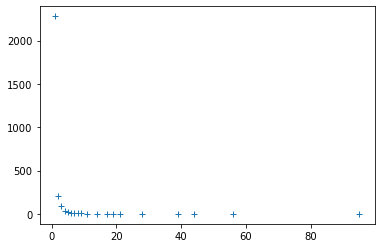

In [9]:
plt.plot(list(G_E.keys()),list(G_E.values()),'+') # use list() to convert information in network to list
plt.show()

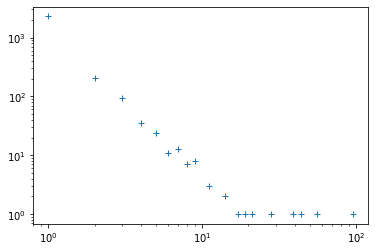

In [10]:
plt.xscale('log')
plt.yscale('log')
plt.plot(list(G_E.keys()),list(G_E.values()),'+') # use list() to convert information in network to list
plt.show()

In [11]:
def BC1(G,o): 
    A=[o] 
    V=[] 
    l=0 
    p={} 
    m={} 
    z={} 
    p[o]=[] 
    m[o]=1 
    z[l]=[o] 
    while len(A)>0: 
        # print len(A) 
        l=l+1 
        nA=[] 
        for i in A: 
            for j in G.neighbors(i): 
                if (j not in V) and (j not in A): 
                    if j not in nA: 
                        nA.append(j) 
                        z[l]=z.get(l,[]) 
                        z[l].append(j) 
                    p[j]=p.get(j,[]) 
                    p[j].append(i) 
                    m[j]=m.get(j,0) 
                    m[j]=m[j]+m[i] 
            V.append(i) 
        A=nA 
    lf=l-1
    b={} 
    for i in G.nodes(): 
        b[i]=0 
    for l in range(lf,0,-1): 
        for i in z[l]: 
            b[i]=b[i]+m[i] 
            for j in p[i]: 
                b[j]=b[j]+m[j]*b[i]/m[i] 
    return(b)

def BC(G): 
    B={} 
    for i in G.nodes(): 
        B[i]=0 
    for o in G.nodes(): 
        b=BC1(G,o) 
        for i in b.keys(): 
            B[i]=B[i]+b[i] 
    for i in G.nodes(): 
        B[i]=B[i]/2 
    return(B)

In [12]:
# betweenness centrality

myList = sorted(BC(G).items(), key=lambda x: x[1], reverse=True)

In [26]:
myList[:10]

[('realDonaldTrump', 265510.0),
 ('aspiesmom', 66451.0),
 ('Moura_v_belcher', 59570.0),
 ('Twitter', 54825.0),
 ('PeruBebeChrissy', 54650.0),
 ('PamelaGeller', 52801.0),
 ('YouTube', 52009.0),
 ('RealMeas', 42043.0),
 ('WhiteHouse', 39693.0),
 ('FoxNews', 39259.0)]

In [25]:
# eigenvector centrality - how important are the node's neighbors?
G_ec = nx.eigenvector_centrality(G)
G_ec = sorted(G_ec.items(), key=lambda x: x[1], reverse=True)
G_ec[:10]

[('realDonaldTrump', 0.6993566991097006),
 ('aspiesmom', 0.08530770951340617),
 ('TexanIndiana', 0.07906141565894022),
 ('ConsiderThis1', 0.07742131754551015),
 ('Moura_v_belcher', 0.07657048770574529),
 ('AWall902', 0.07575253129183986),
 ('STLRULES', 0.07507207329210425),
 ('Bobby56936946', 0.07507207329210425),
 ('cgutfive', 0.07507207329210425),
 ('Messiah_79', 0.07507207329210425)]

In [15]:
plt.figure(figsize = (100,100))
nx.draw(G, pos=pos, with_labels = True)
plt.savefig('graphfinal.png')
plt.show()

# Network Visualization w/ Holoviews

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
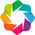

In [17]:
import holoviews as hv
from holoviews import opts

hv.extension('bokeh')

defaults = dict(width=800, height=800)
hv.opts.defaults(
    opts.EdgePaths(**defaults), opts.Graph(**defaults), opts.Nodes(**defaults))

In [18]:
# create interactive network

simple_graph = hv.Graph.from_networkx(G, nx.spring_layout)
simple_graph

:Graph   [start,end]

In [19]:
simple_graph.relabel('Directed Graph').opts(directed=True, node_size=5, arrowhead_length=0.001, inspection_policy='nodes')

:Graph   [start,end]